# Etude du DF total

## Importer les librairies

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re


### Obtenir l'info complète du DF

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
#pd.set_option('display.max_colwidth', None)

## Importer le DF

In [3]:
df= pd.read_csv("gaming_total_v2.csv", index_col=0)
df.head()

C:\Users\debor\AppData\Local\Temp\ipykernel_53068\2852934180.py:1: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df= pd.read_csv("gaming_total_v2.csv", index_col=0)


,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,developpeur_goo,distributeur_goo,langue_goo,PEGI_goo,game_series_goo,game_mode_goo,developpeur_wiki,langue_wiki,PEGI_wiki,game_mode_wiki,Meta_NP,Meta_VP,Meta_NUsers,Meta_VUsers,summary,meta_score,user_review,Rank,test_note_JVC,avis_count_JVC,avis_note_JVC,Classification_Age_JVC,max_joueurs_JVC,Mode_JVC,Support_JVC,langue_parlée_JVC,texte_JVC,nb_joueurs_JVC
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74,"Nintendo, PLUS",NaN,NaN,NaN,NaN,NaN,Nintendo EAD,Multilingue,7.0,Un joueurMultijoueur (de 2 à 4),76.0,51.0,8.1,539.0,Tennis (1-4 players): Players grab the control...,76.0,8.1,1.0,14.0,687.0,13.8,7.0,4.0,NaN,DVD,français,français,4.0
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,Universal Pictures,Anglais,NaN,NaN,NaN,NaN,NaN,NaN,NaN,84.0,14.0,8.4,119.0,NaN,NaN,NaN,NaN,19.0,3.0,19.0,3.0,NaN,Jouable en solo,eShop Console Virtuelle Cartouche,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82,NaN,NaN,NaN,NaN,NaN,NaN,Nintendo EAD,Multilingue,3.0,Local1 à 4 joueursEn ligne (jusqu'au 20 mai 20...,82.0,73.0,8.5,1167.0,Mario Kart Wii comes with the intuitive Wii Wh...,82.0,8.4,3.0,16.0,3023.0,17.4,3.0,4.0,Multi sur le même écran Multi en ligne,DVD,NaN,NaN,4.0
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00,"Nintendo, Nintendo Entertainment Analysis & De...",NaN,NaN,NaN,NaN,Multijoueur,NaN,NaN,NaN,NaN,80.0,73.0,8.3,346.0,Wii Sports Resort is a collection of fun sport...,80.0,8.2,4.0,15.0,581.0,16.5,3.0,4.0,NaN,DVD,français,français,4.0
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# EDA (Analyse Exploratoire des Données):
## Analyse de la forme: 

In [4]:
df.shape

(16628, 38)

## Suppression des variables non exploitables et des lignes en double

<Axes: >

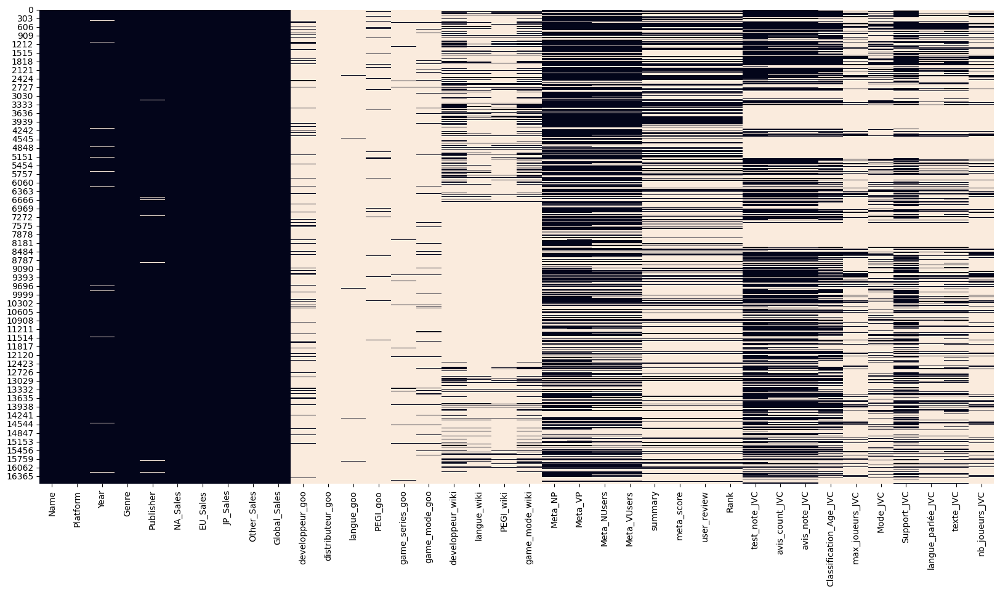

In [5]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)
# donne une image du datset en entier pour avoir un aperçu des Nans

In [6]:
df= df.drop_duplicates()

In [7]:
df.shape

(16628, 38)

## Nombre de modalités pour chaques variables

In [8]:
for col in df.columns:
   print(col,':' ,df[col].nunique())

Name : 11493
Platform : 31
Year : 39
Genre : 12
Publisher : 578
NA_Sales : 409
EU_Sales : 305
JP_Sales : 244
Other_Sales : 157
Global_Sales : 623
developpeur_goo : 852
distributeur_goo : 7
langue_goo : 37
PEGI_goo : 8
game_series_goo : 270
game_mode_goo : 104
developpeur_wiki : 977
langue_wiki : 240
PEGI_wiki : 5
game_mode_wiki : 267
Meta_NP : 84
Meta_VP : 113
Meta_NUsers : 89
Meta_VUsers : 1111
summary : 4105
meta_score : 78
user_review : 82
Rank : 5163
test_note_JVC : 19
avis_count_JVC : 546
avis_note_JVC : 181
Classification_Age_JVC : 8
max_joueurs_JVC : 20
Mode_JVC : 44
Support_JVC : 531
langue_parlée_JVC : 3
texte_JVC : 3
nb_joueurs_JVC : 20


In [9]:
print('Data Types:')
print(df.dtypes)

Data Types:
Name                       object
Platform                   object
Year                      float64
Genre                      object
Publisher                  object
NA_Sales                  float64
EU_Sales                  float64
JP_Sales                  float64
Other_Sales               float64
Global_Sales              float64
developpeur_goo            object
distributeur_goo           object
langue_goo                 object
PEGI_goo                  float64
game_series_goo            object
game_mode_goo              object
developpeur_wiki           object
langue_wiki                object
PEGI_wiki                 float64
game_mode_wiki             object
Meta_NP                   float64
Meta_VP                   float64
Meta_NUsers               float64
Meta_VUsers               float64
summary                    object
meta_score                float64
user_review                object
Rank                      float64
test_note_JVC             float64
av

### Type de variables

In [10]:
df.dtypes.value_counts()

float64    20
object     18
dtype: int64

<Axes: >

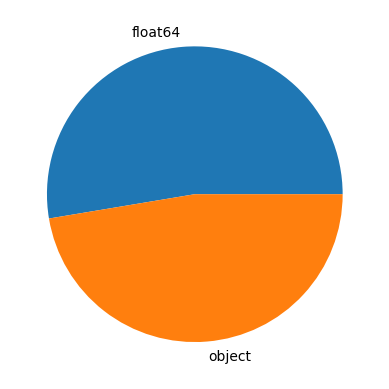

In [16]:
df.dtypes.value_counts().plot.pie()

In [11]:
print(df.isna().sum())


Name                          0
Platform                      0
Year                        270
Genre                         0
Publisher                    58
NA_Sales                      0
EU_Sales                      0
JP_Sales                      0
Other_Sales                   0
Global_Sales                  0
developpeur_goo           15128
distributeur_goo          16614
langue_goo                16553
PEGI_goo                  16142
game_series_goo           16104
game_mode_goo             15783
developpeur_wiki          13533
langue_wiki               15192
PEGI_wiki                 15545
game_mode_wiki            13791
Meta_NP                    5796
Meta_VP                    5766
Meta_NUsers                6670
Meta_VUsers                6670
summary                   11437
meta_score                11434
user_review               11434
Rank                      11434
test_note_JVC              6596
avis_count_JVC             7495
avis_note_JVC              7495
Classifi

In [12]:
print("Pourcentage de valeurs nulles:")
(df.isna().sum()/df.shape[0]).sort_values(ascending=True).round(2)*100

Pourcentage de valeurs nulles:


Name                        0.0
Platform                    0.0
Genre                       0.0
NA_Sales                    0.0
EU_Sales                    0.0
JP_Sales                    0.0
Other_Sales                 0.0
Global_Sales                0.0
Publisher                   0.0
Year                        2.0
Meta_VP                    35.0
Meta_NP                    35.0
test_note_JVC              40.0
Meta_NUsers                40.0
Meta_VUsers                40.0
avis_note_JVC              45.0
avis_count_JVC             45.0
Support_JVC                56.0
Classification_Age_JVC     57.0
Rank                       69.0
meta_score                 69.0
user_review                69.0
summary                    69.0
texte_JVC                  72.0
langue_parlée_JVC          76.0
Mode_JVC                   76.0
developpeur_wiki           81.0
game_mode_wiki             83.0
max_joueurs_JVC            85.0
nb_joueurs_JVC             85.0
developpeur_goo            91.0
langue_w

In [13]:
cat_data = df.select_dtypes(include=['object'])
num_data = df.select_dtypes(include=['int64', 'float64'])
 
print('Variables catégorielles :', cat_data.columns)
print('Variables numériques :', num_data.columns)

Variables catégorielles : Index(['Name', 'Platform', 'Genre', 'Publisher', 'developpeur_goo',
       'distributeur_goo', 'langue_goo', 'game_series_goo', 'game_mode_goo',
       'developpeur_wiki', 'langue_wiki', 'game_mode_wiki', 'summary',
       'user_review', 'Mode_JVC', 'Support_JVC', 'langue_parlée_JVC',
       'texte_JVC'],
      dtype='object')
Variables numériques : Index(['Year', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales',
       'Global_Sales', 'PEGI_goo', 'PEGI_wiki', 'Meta_NP', 'Meta_VP',
       'Meta_NUsers', 'Meta_VUsers', 'meta_score', 'Rank', 'test_note_JVC',
       'avis_count_JVC', 'avis_note_JVC', 'Classification_Age_JVC',
       'max_joueurs_JVC', 'nb_joueurs_JVC'],
      dtype='object')


In [14]:
print("Nombre de colonne avec moins de 90% de valeurs nulles :",df.columns[df.isna().sum()/df.shape[0] >0.9].value_counts().sum())
print(df.columns[df.isna().sum()/df.shape[0] >0.9].value_counts())

Nombre de colonne avec moins de 90% de valeurs nulles : 8
developpeur_goo     1
distributeur_goo    1
langue_goo          1
PEGI_goo            1
game_series_goo     1
game_mode_goo       1
langue_wiki         1
PEGI_wiki           1
dtype: int64


## Conclusion Analyse de la forme: 
- Identification de la target : "Global_Sales"
- Nb de lignes et de colonnes : 16628, 38
- Types de variables : object -> 18, float64 -> 20
- Identification des Nans : 8 colonnes avec 90% de valeurs nulles

## Analyse de fond:

### Analyse de la variable cible

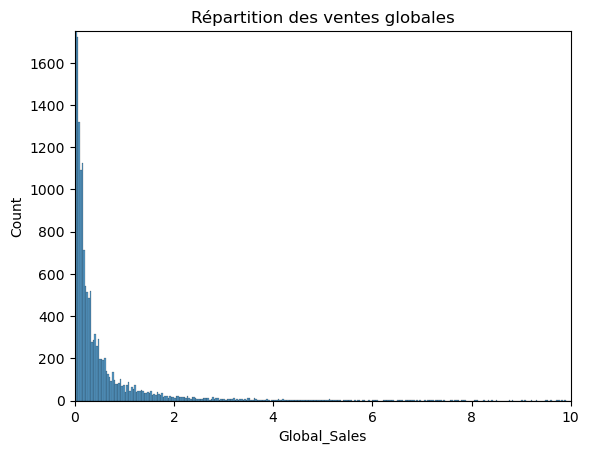

In [25]:
plt.figure()
plt.xlim(0,10)
plt.ylim(0,1750)
sns.histplot(num_data['Global_Sales'])
plt.title("Répartition des ventes globales");

### Analyse des variables numériques

C:\Users\debor\AppData\Local\Temp\ipykernel_53068\3205538130.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_data[col], label=col)
C:\Users\debor\AppData\Local\Temp\ipykernel_53068\3205538130.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_data[col], label=col)
C:\Users\debor\App

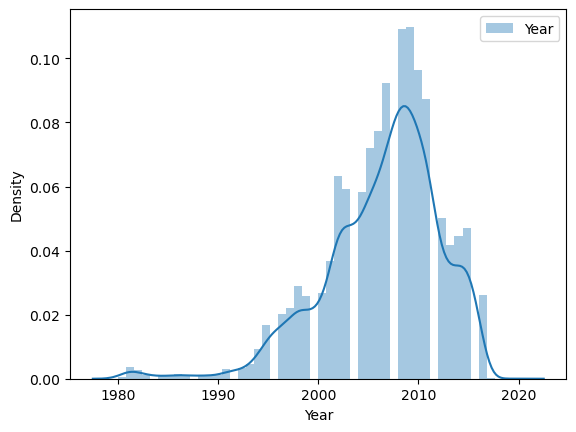

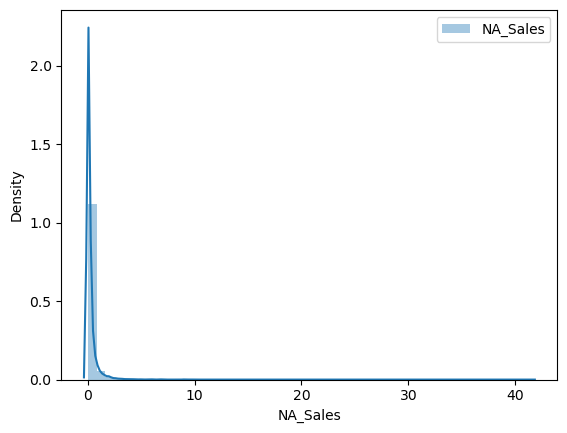

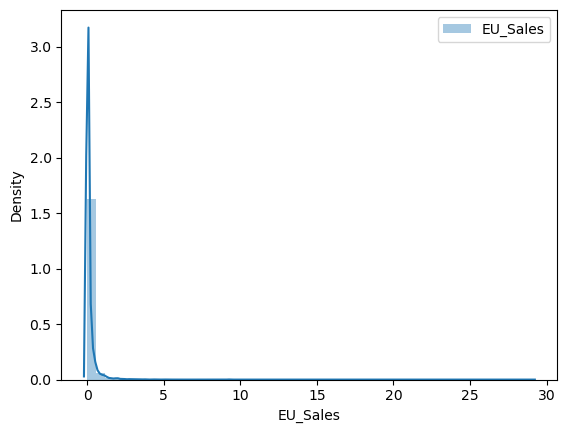

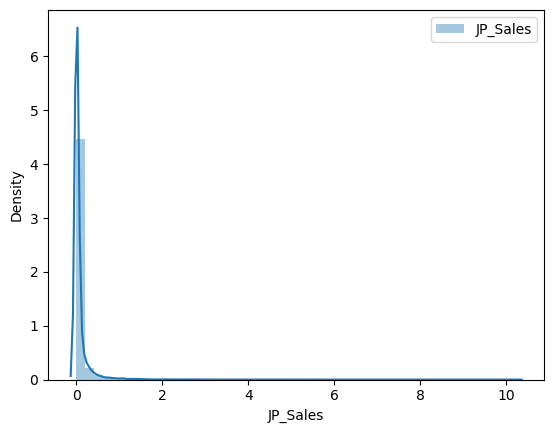

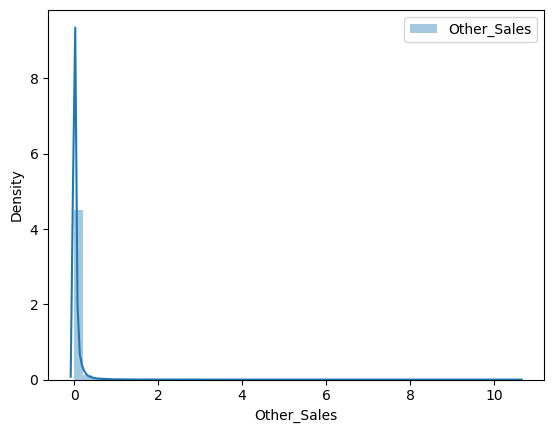

...

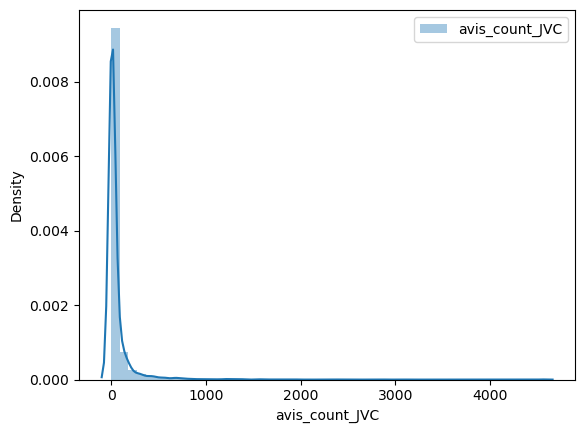

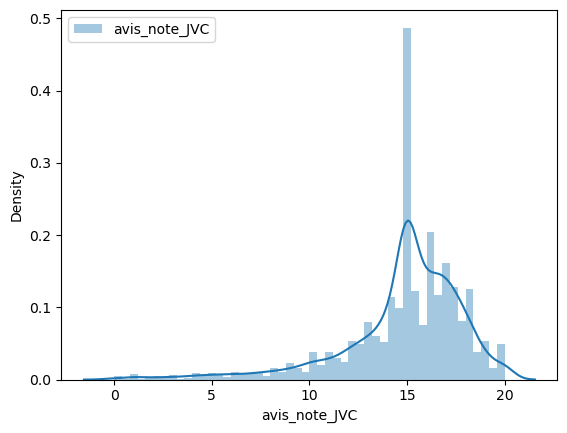

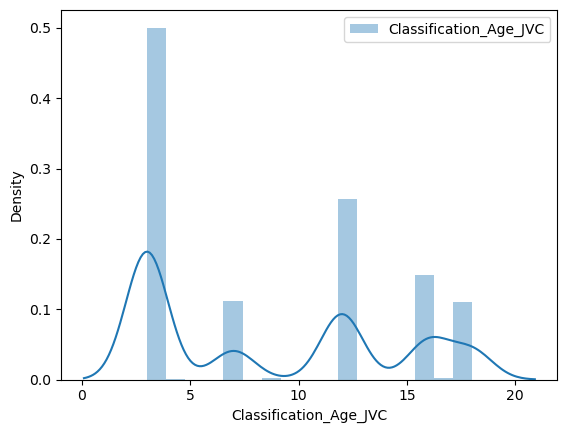

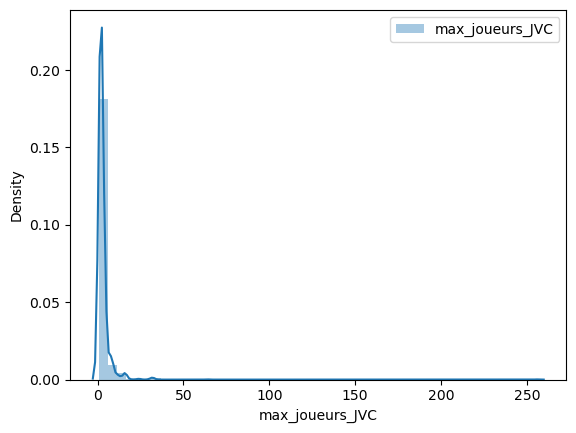

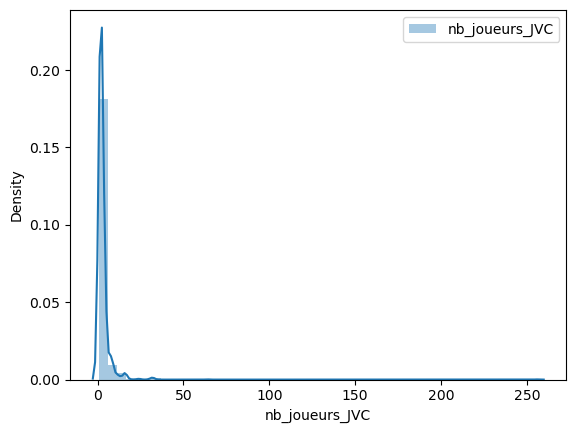

In [19]:
for col in num_data:
    plt.figure()
    sns.distplot(num_data[col], label=col)
    #sns.distplot(df['Global_Sales'], label= 'Global_Sales')
    plt.legend()

### Analyse des Variables qualitatives

In [20]:
for col in cat_data:
    print(f'{col :-<50} {cat_data[col].unique()}')

Name---------------------------------------------- ['Wii Sports' 'Super Mario Bros.' 'Mario Kart Wii' ... 'Plushees'
 'Woody Woodpecker in Crazy Castle 5' 'Know How 2']
Platform------------------------------------------ ['Wii' 'NES' 'GB' 'DS' 'X360' 'PS3' 'PS2' 'SNES' 'GBA' '3DS' 'PS4' 'N64'
 'PS' 'XB' 'PC' '2600' 'PSP' 'XOne' 'GC' 'WiiU' 'GEN' 'DC' 'PSV' 'SAT'
 'SCD' 'WS' 'NG' 'TG16' '3DO' 'GG' 'PCFX']
Genre--------------------------------------------- ['Sports' 'Platform' 'Racing' 'Role-Playing' 'Puzzle' 'Misc' 'Shooter'
 'Simulation' 'Action' 'Fighting' 'Adventure' 'Strategy']
Publisher----------------------------------------- ['Nintendo' 'Microsoft Game Studios' 'Take-Two Interactive'
 'Sony Computer Entertainment' 'Activision' 'Ubisoft' 'Bethesda Softworks'
 'Electronic Arts' 'Sega' 'SquareSoft' 'Atari' '505 Games' 'Capcom'
 'GT Interactive' 'Konami Digital Entertainment'
 'Sony Computer Entertainment Europe' 'Square Enix' 'LucasArts'
 'Virgin Interactive' 'Warner Bros. Interactiv

c:\Users\debor\anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 12503 (\N{KATAKANA LETTER PU}) missing from current font.
  func(*args, **kwargs)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 12525 (\N{KATAKANA LETTER RO}) missing from current font.
  func(*args, **kwargs)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 37326 (\N{CJK UNIFIED IDEOGRAPH-91CE}) missing from current font.
  func(*args, **kwargs)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 29699 (\N{CJK UNIFIED IDEOGRAPH-7403}) missing from current font.
  func(*args, **kwargs)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 12501 (\N{KATAKANA LETTER HU}) missing from current font.
  func(*args, **kwargs)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 12449 (\N{KATAKANA LETTER SMALL A}) miss

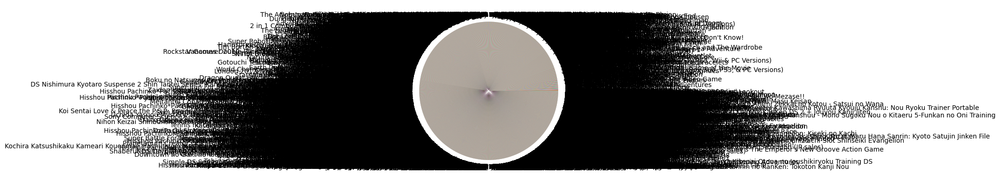

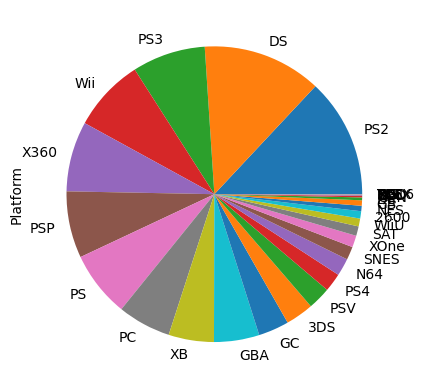

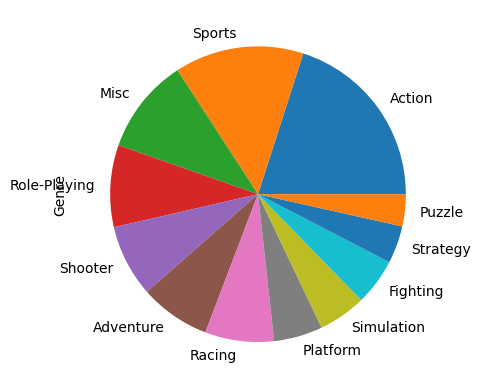

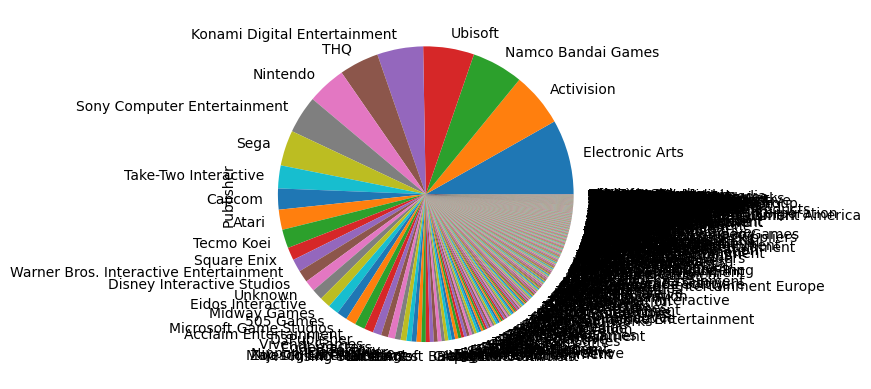

c:\Users\debor\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12503 (\N{KATAKANA LETTER PU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12525 (\N{KATAKANA LETTER RO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 37326 (\N{CJK UNIFIED IDEOGRAPH-91CE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 29699 (\N{CJK UNIFIED IDEOGRAPH-7403}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12501 (\N{KATAKANA LETTER HU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\debor

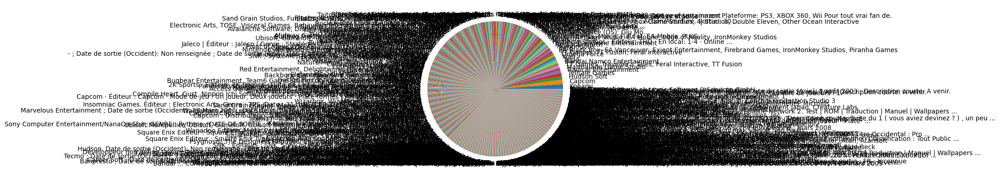

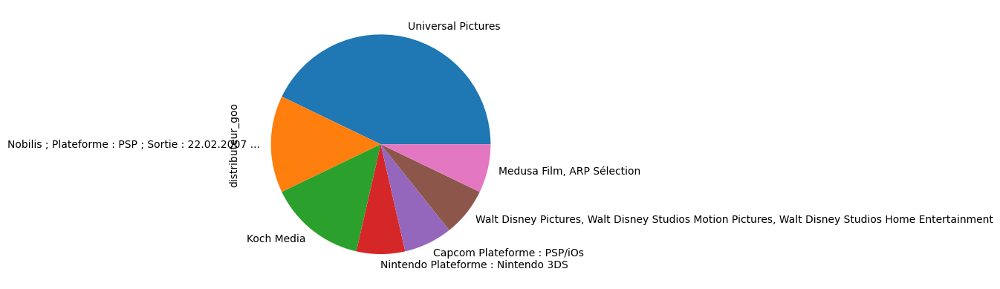

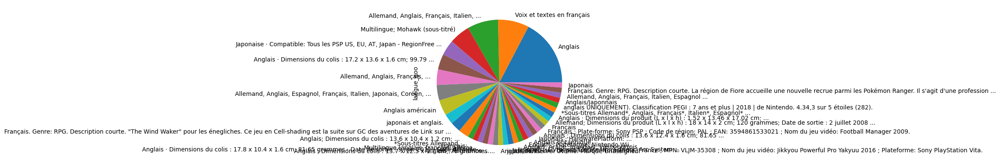

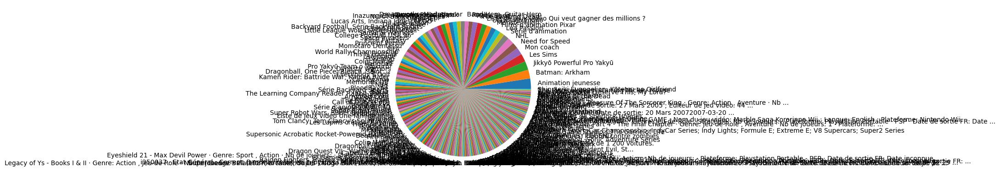

c:\Users\debor\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12399 (\N{HIRAGANA LETTER HA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12400 (\N{HIRAGANA LETTER BA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12383 (\N{HIRAGANA LETTER TA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12369 (\N{HIRAGANA LETTER KE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\debor\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 65281 (\N{FULLWIDTH EXCLAMATION MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\debor\anacond

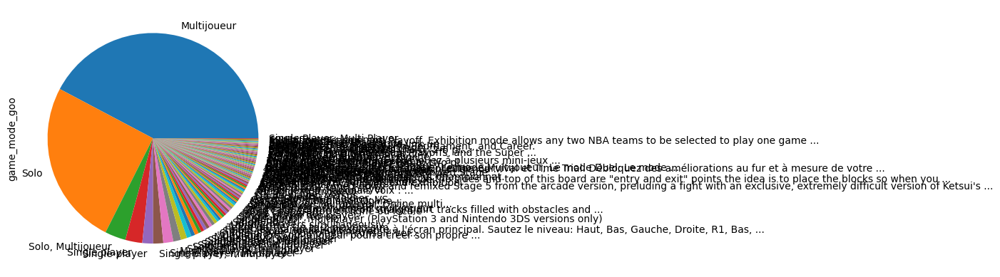

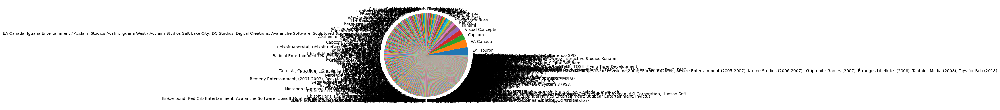

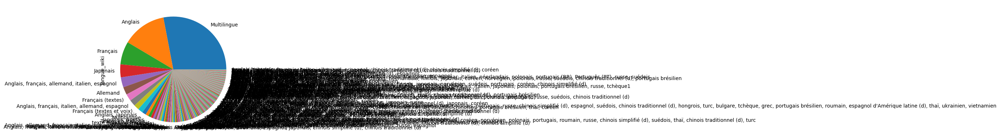

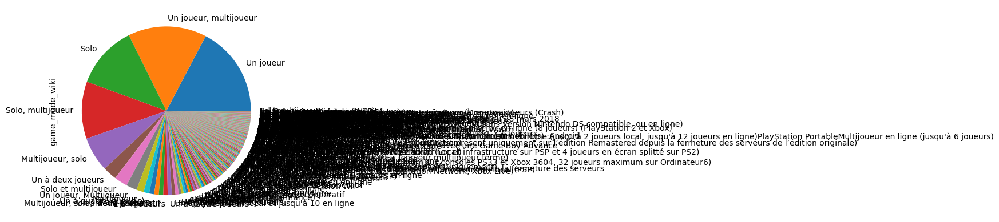

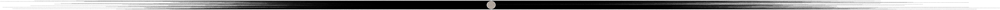

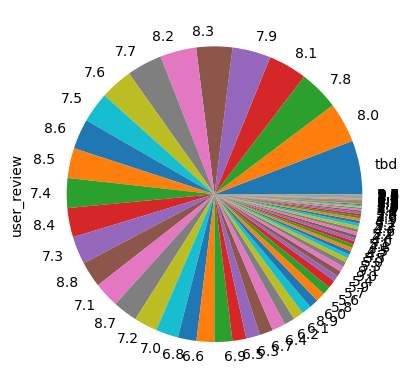

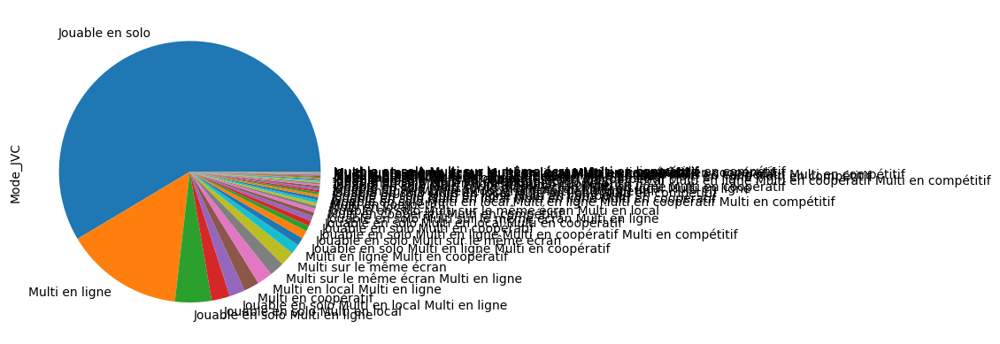

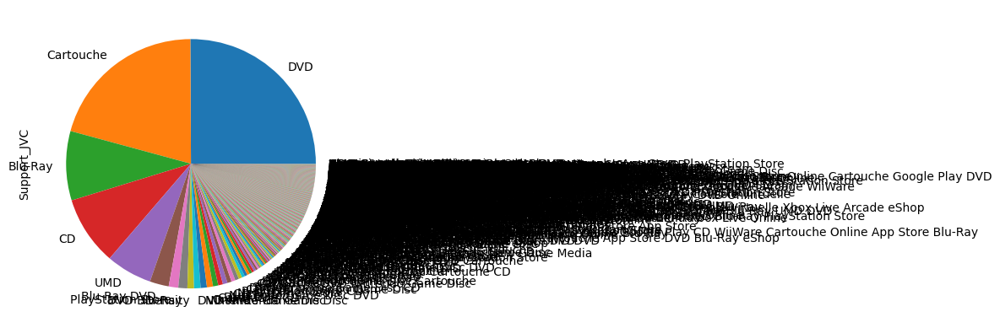

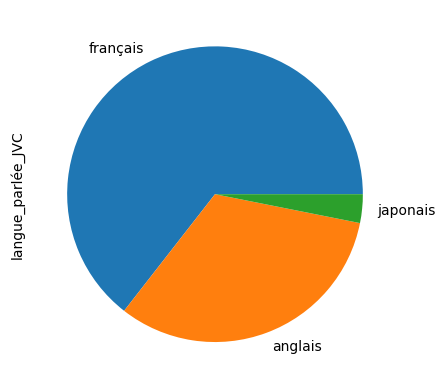

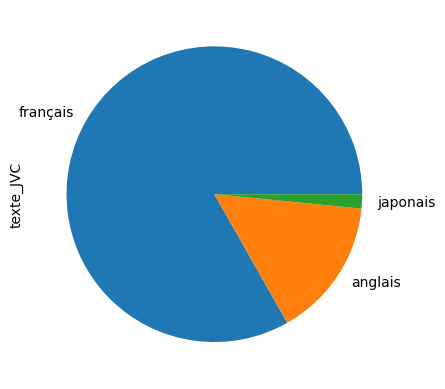

In [21]:
for col in cat_data:
    plt.figure()
    cat_data[col].value_counts().plot.pie()

### Relation Target / variables catégorielles

C:\Users\debor\AppData\Local\Temp\ipykernel_28432\18815425.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()
c:\Users\debor\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

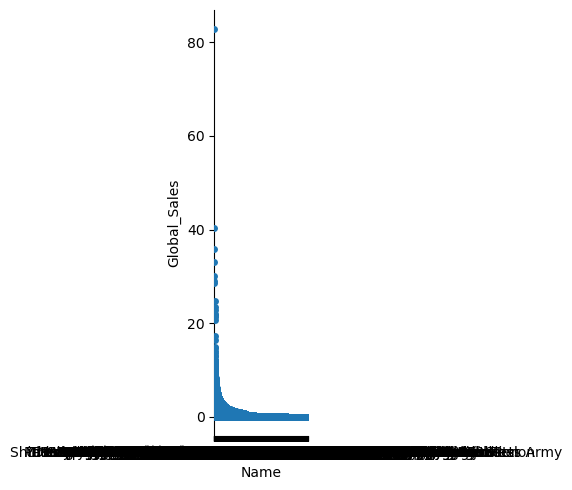

<Figure size 640x480 with 0 Axes>

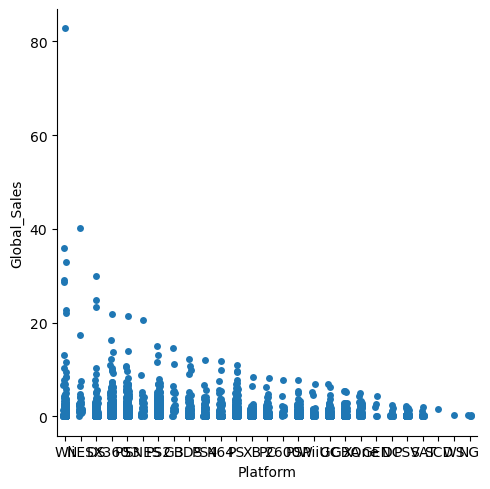

<Figure size 640x480 with 0 Axes>

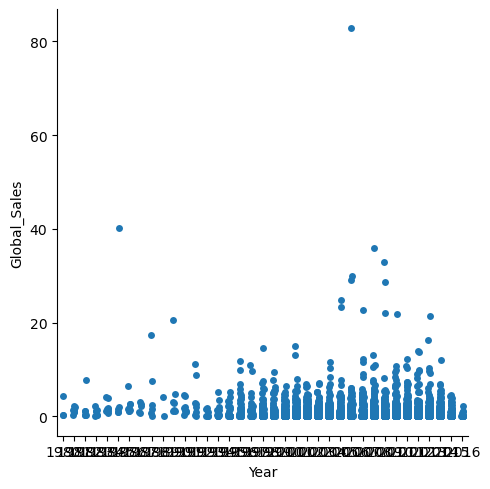

<Figure size 640x480 with 0 Axes>

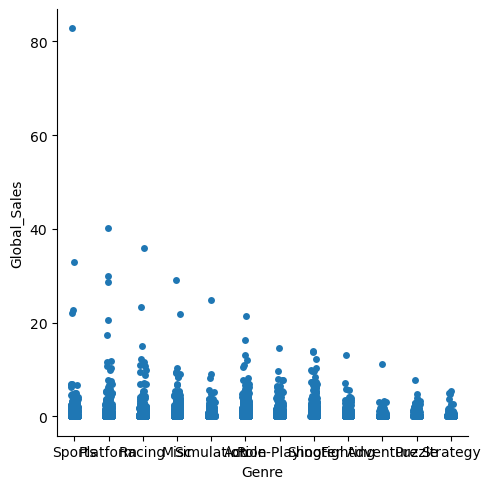

<Figure size 640x480 with 0 Axes>

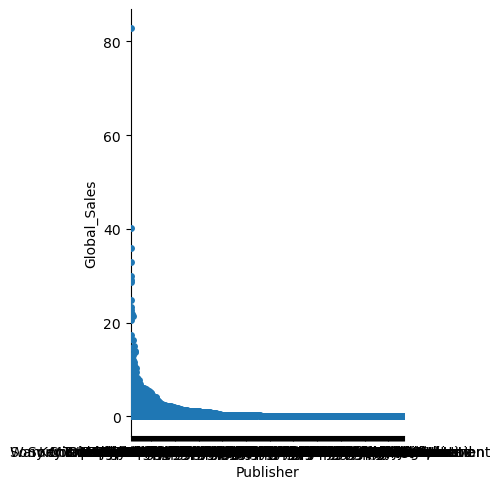

<Figure size 640x480 with 0 Axes>

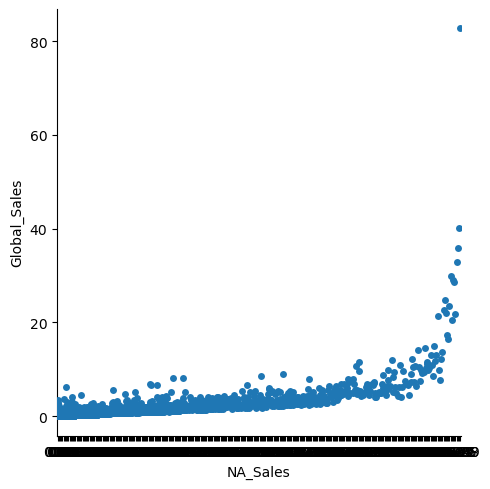

<Figure size 640x480 with 0 Axes>

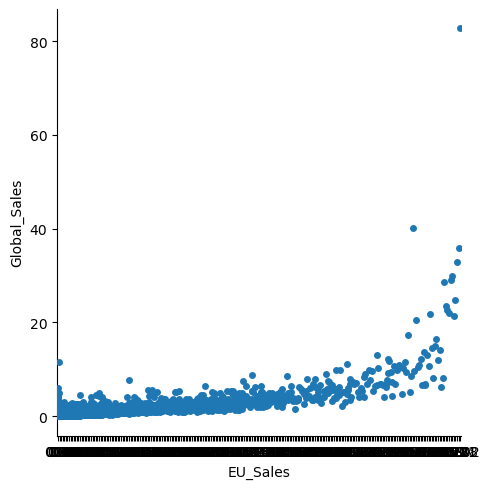

<Figure size 640x480 with 0 Axes>

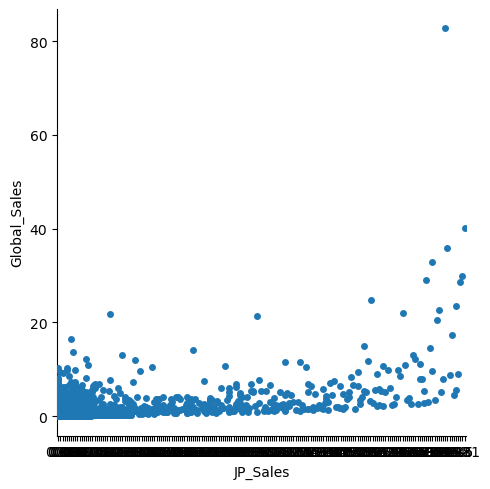

<Figure size 640x480 with 0 Axes>

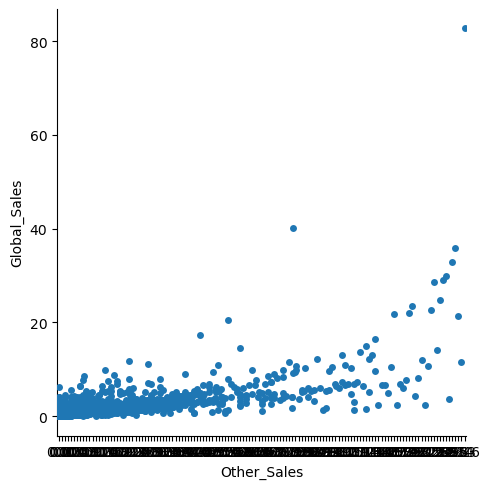

<Figure size 640x480 with 0 Axes>

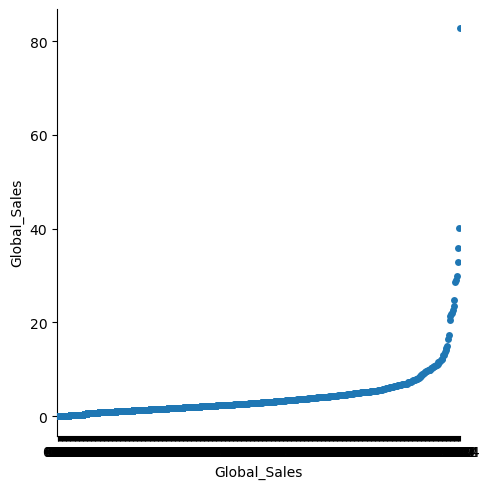

<Figure size 640x480 with 0 Axes>

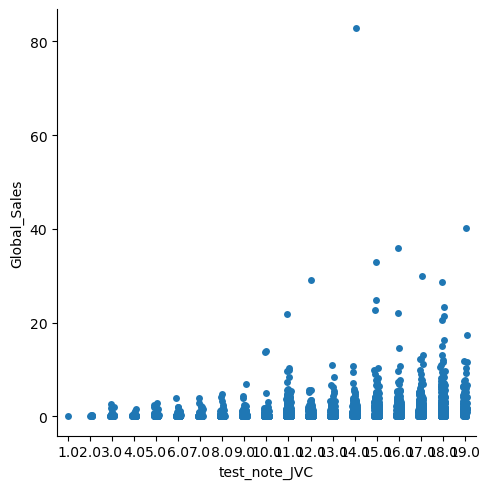

<Figure size 640x480 with 0 Axes>

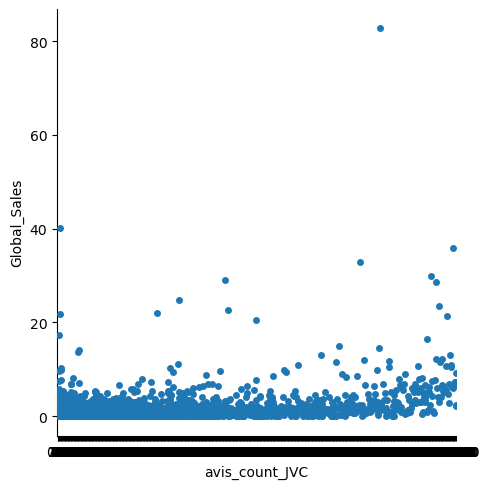

<Figure size 640x480 with 0 Axes>

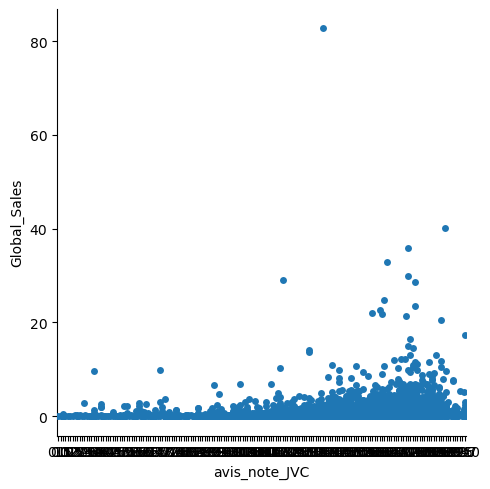

<Figure size 640x480 with 0 Axes>

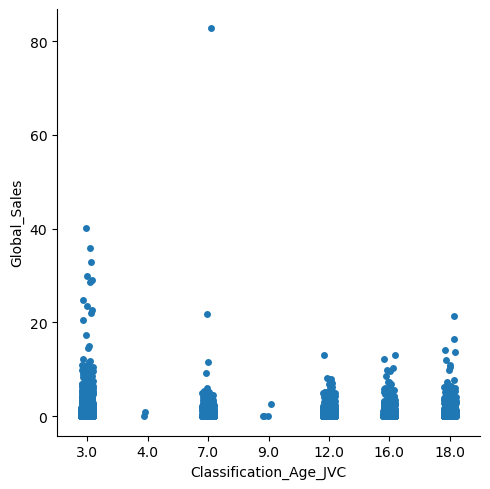

<Figure size 640x480 with 0 Axes>

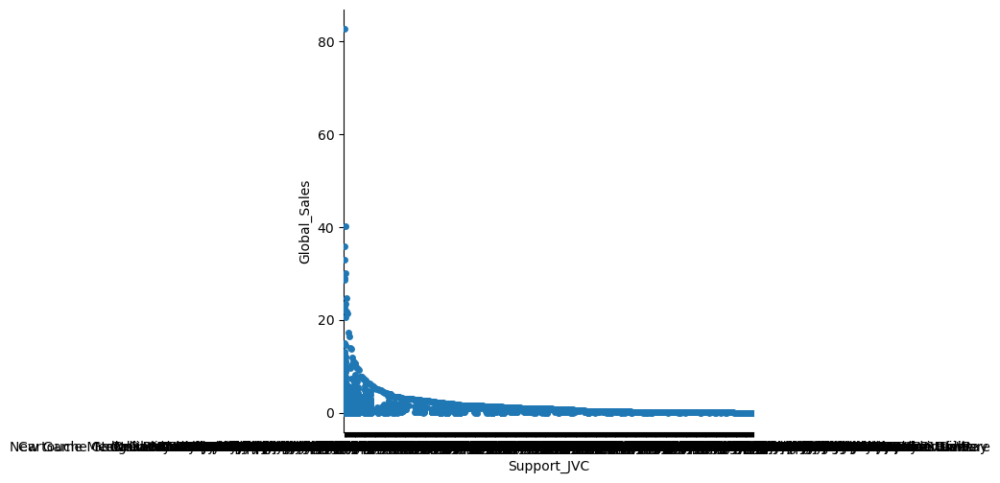

In [ ]:
for col in df:
    plt.figure()
    sns.catplot(data=df, x=df[col], y="Global_Sales")


C:\Users\debor\AppData\Local\Temp\ipykernel_28432\2218410642.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=False)


<Axes: >

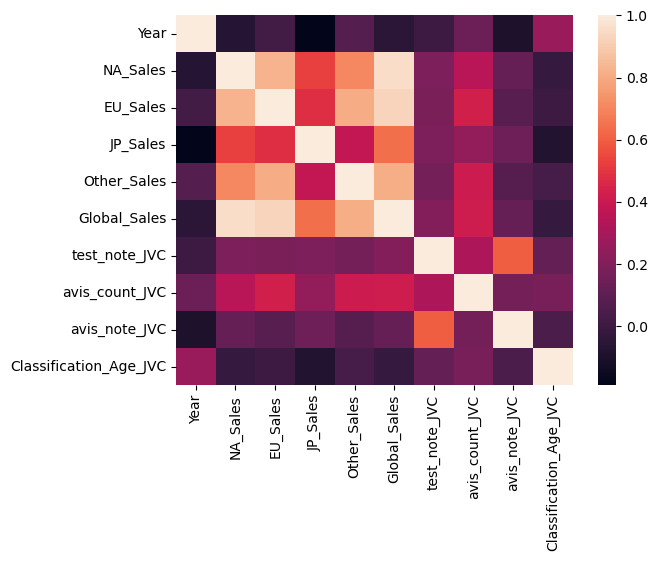

In [ ]:
sns.heatmap(df.corr(),annot=False)

In [ ]:
df['Global_Sales_group']=pd.qcut(df['Global_Sales'], q=4)

<Axes: xlabel='Global_Sales_group', ylabel='count'>

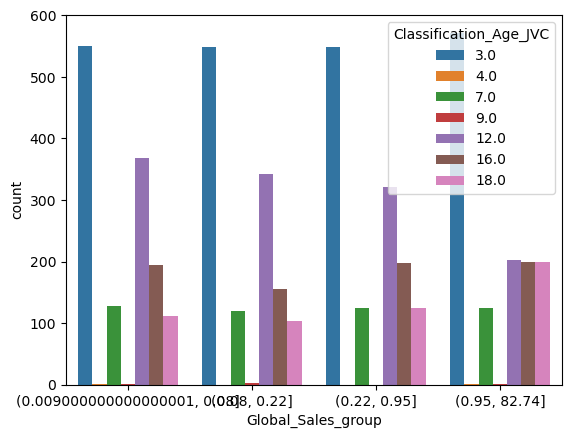

In [ ]:
plt.figure()
sns.countplot(x='Global_Sales_group', hue="Classification_Age_JVC", data=df)

In [ ]:
pd.crosstab(df['Global_Sales_group'], df['Classification_Age_JVC'], normalize=True)


Classification_Age_JVC,3.0,4.0,7.0,9.0,12.0,16.0,18.0
Global_Sales_group,,,,,,,
"(0.009000000000000001, 0.08]",0.105032,0.000191,0.024400,0.000191,0.070339,0.037171,0.021350
"(0.08, 0.22]",0.104651,0.000000,0.022875,0.000381,0.065383,0.029737,0.019825
"(0.22, 0.95]",0.104461,0.000000,0.023637,0.000000,0.061189,0.037743,0.023637
"(0.95, 82.74]",0.109035,0.000191,0.023637,0.000191,0.038696,0.038124,0.037934


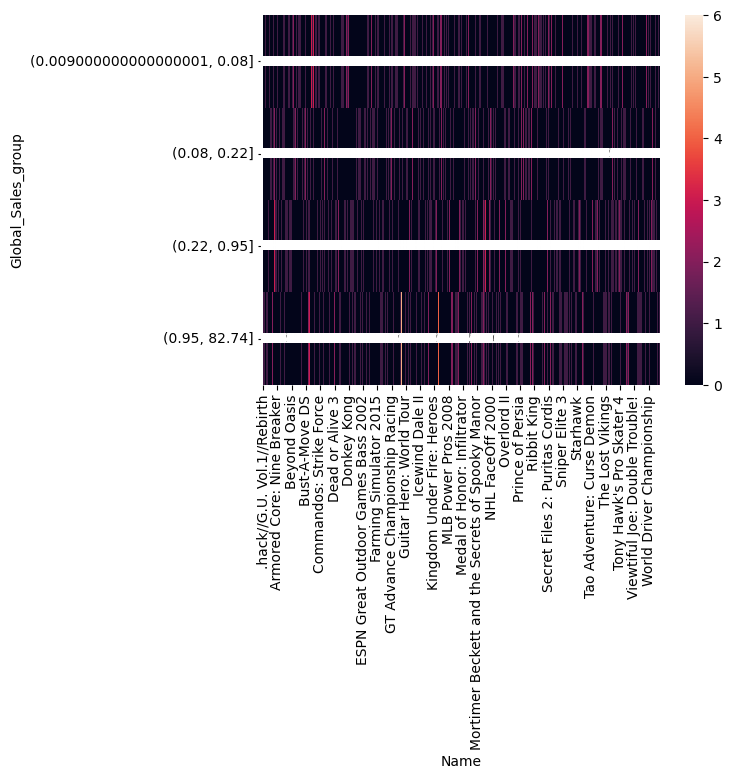

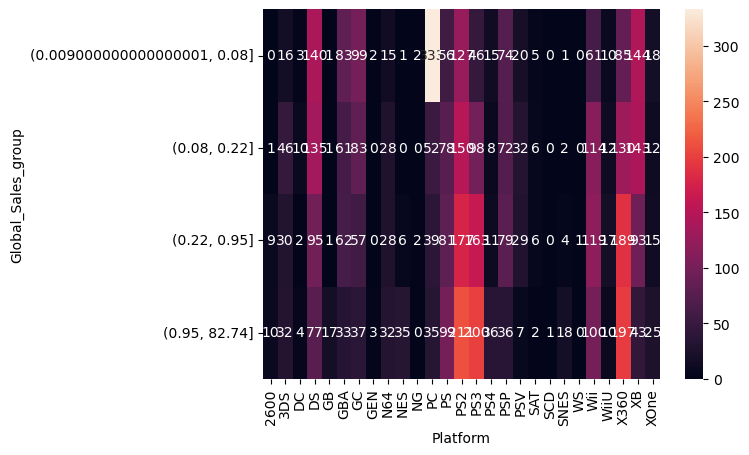

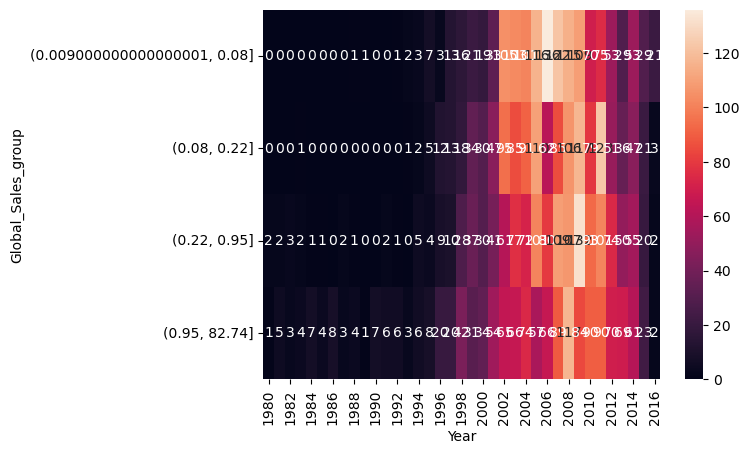

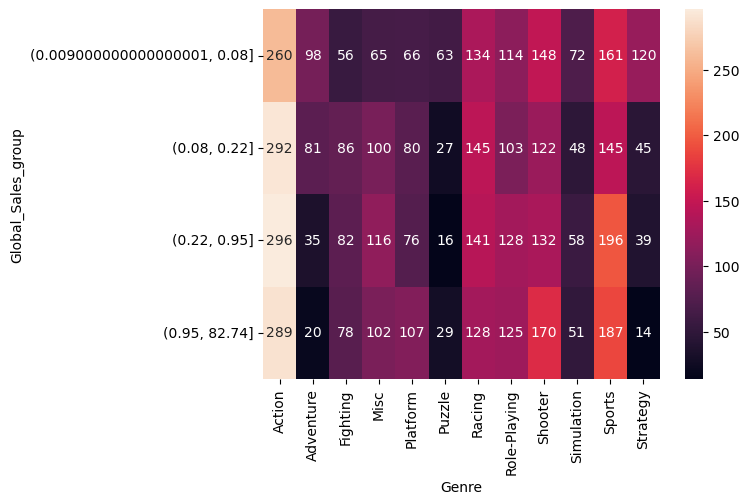

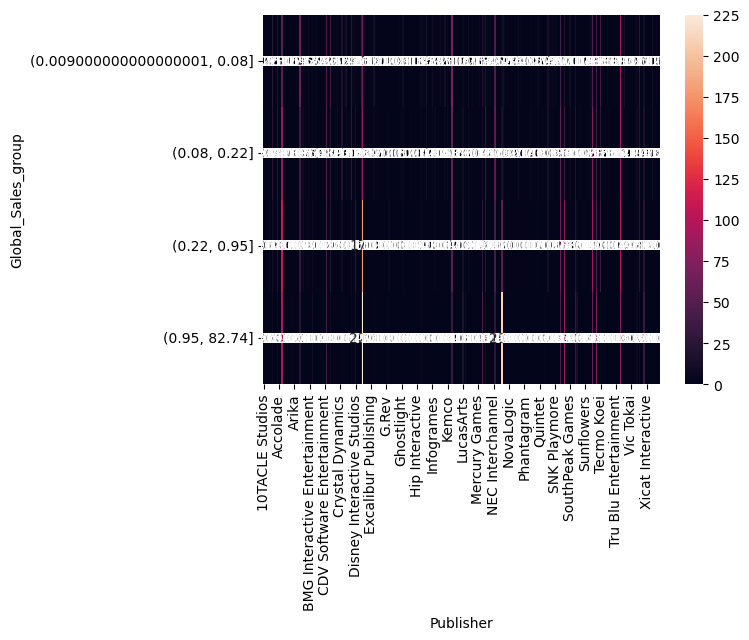

...

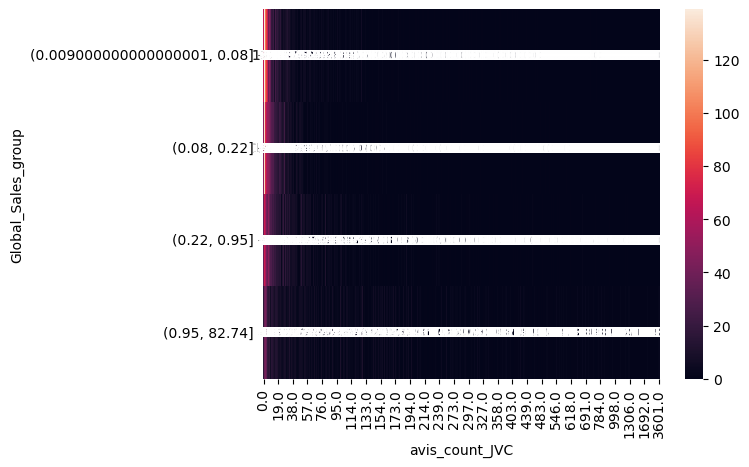

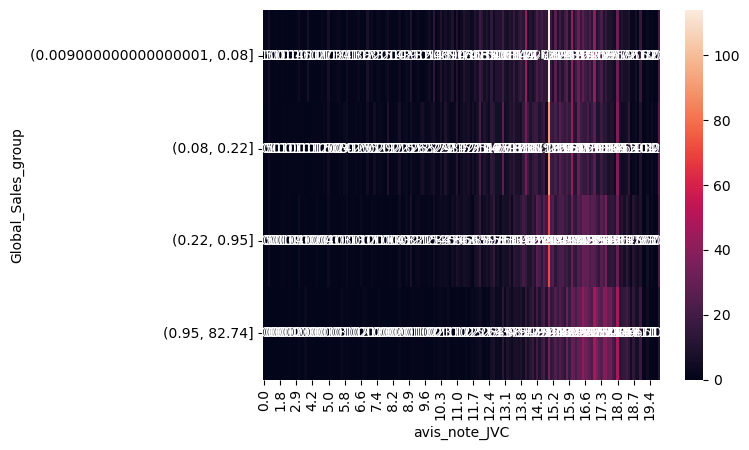

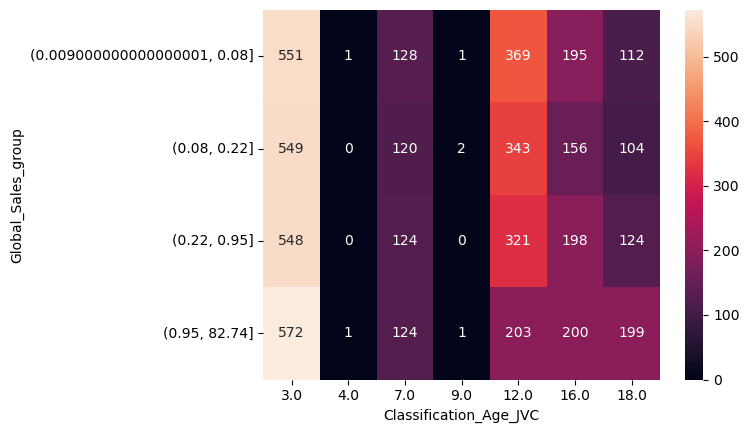

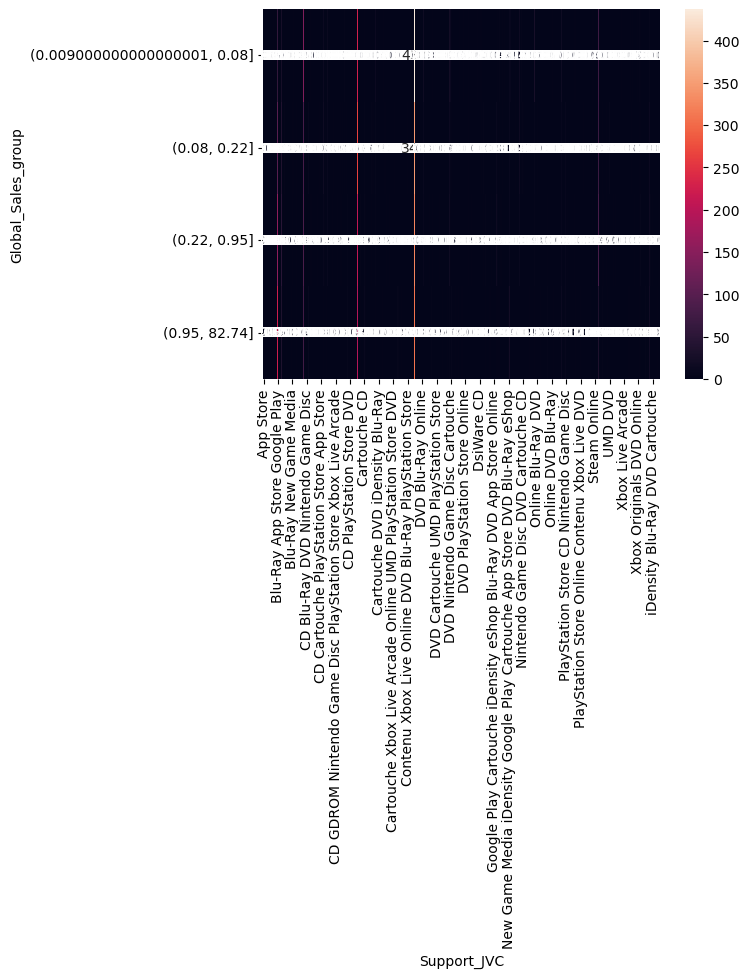

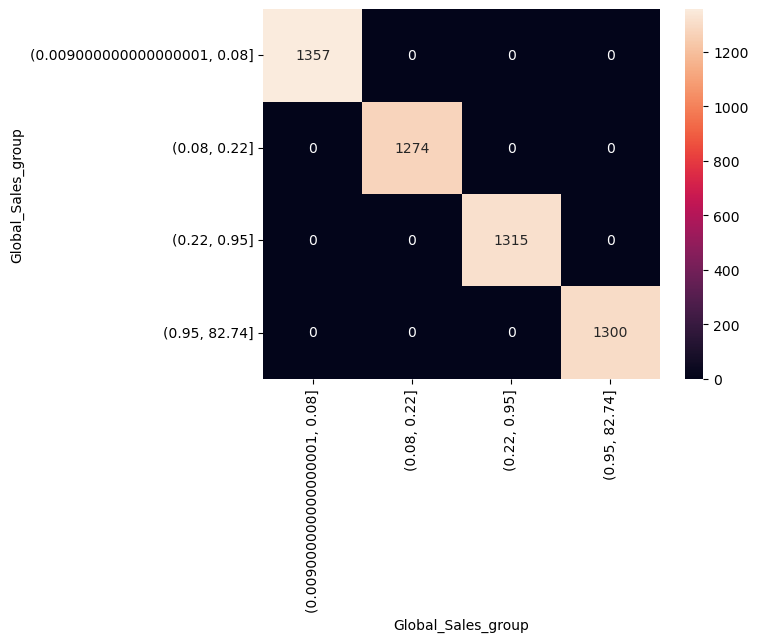

In [ ]:
for col in df:
    plt.figure()
    sns.heatmap(pd.crosstab(df['Global_Sales_group'], df[col]), annot=True, fmt='d')

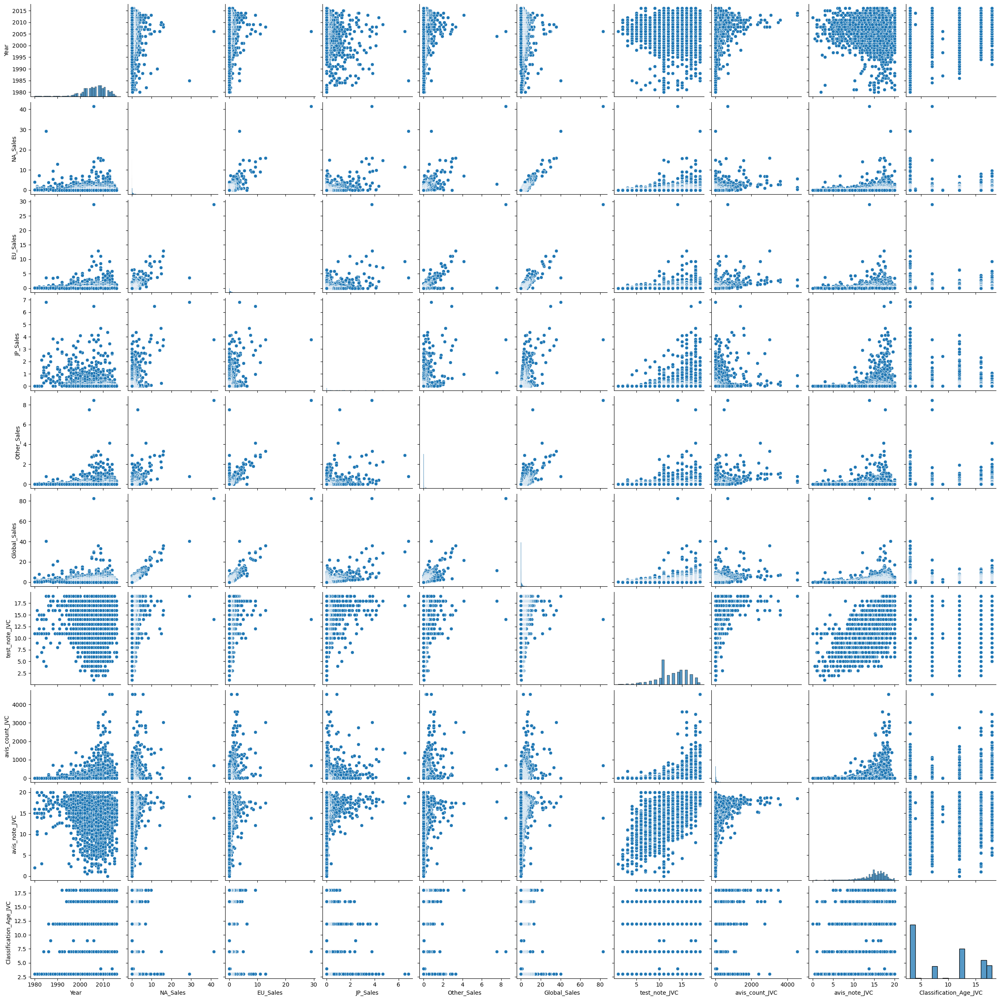

In [ ]:
sns.pairplot(df)

C:\Users\debor\AppData\Local\Temp\ipykernel_28432\3135645621.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.clustermap(df.corr())


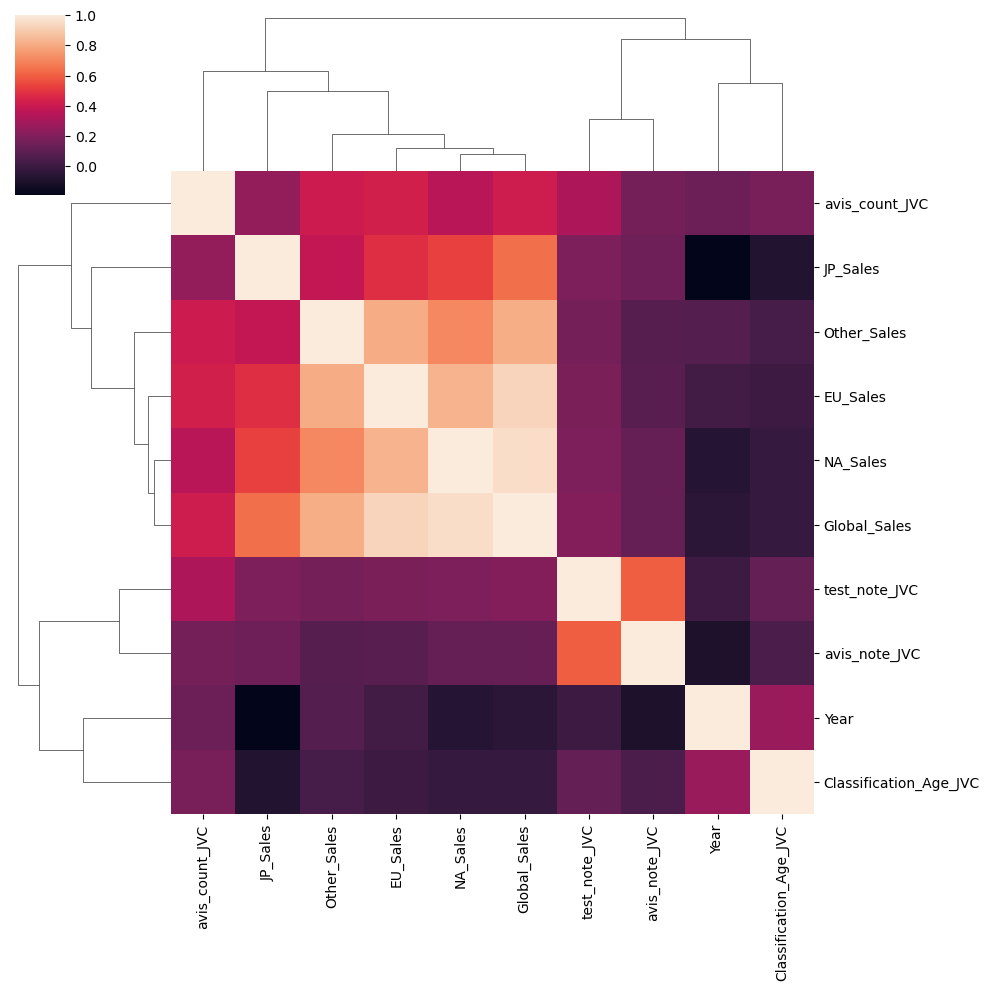

In [ ]:
sns.clustermap(df.corr())

## Conclusion Analyse de fond:
- Visualisation de la target(Histogramme si valeur continue/Boxplot si valeur discrète)
- Compréhension des différentes variables (Internet)
- Visualisation des relations features - target (variables continues/continues, continues/discrètes, discrètes/discrètes)
- Identifications des outliers

## PRE PROCESSING

In [17]:
# On ne conserve que les colonnes qui contiennent plus de 90% de valeurs non nulles
df = df[df.columns[df.isna().sum()/df.shape[0] <0.9]]
print("Pourcentage de valeurs nulles:")
(df.isna().sum()/df.shape[0]).sort_values(ascending=True).round(2)*100

Pourcentage de valeurs nulles:


Name                       0.0
Platform                   0.0
Genre                      0.0
NA_Sales                   0.0
EU_Sales                   0.0
JP_Sales                   0.0
Other_Sales                0.0
Global_Sales               0.0
Publisher                  0.0
Year                       2.0
Meta_VP                   35.0
Meta_NP                   35.0
test_note_JVC             40.0
Meta_NUsers               40.0
Meta_VUsers               40.0
avis_count_JVC            45.0
avis_note_JVC             45.0
Support_JVC               56.0
Classification_Age_JVC    57.0
meta_score                69.0
user_review               69.0
Rank                      69.0
summary                   69.0
dtype: float64

<Axes: >

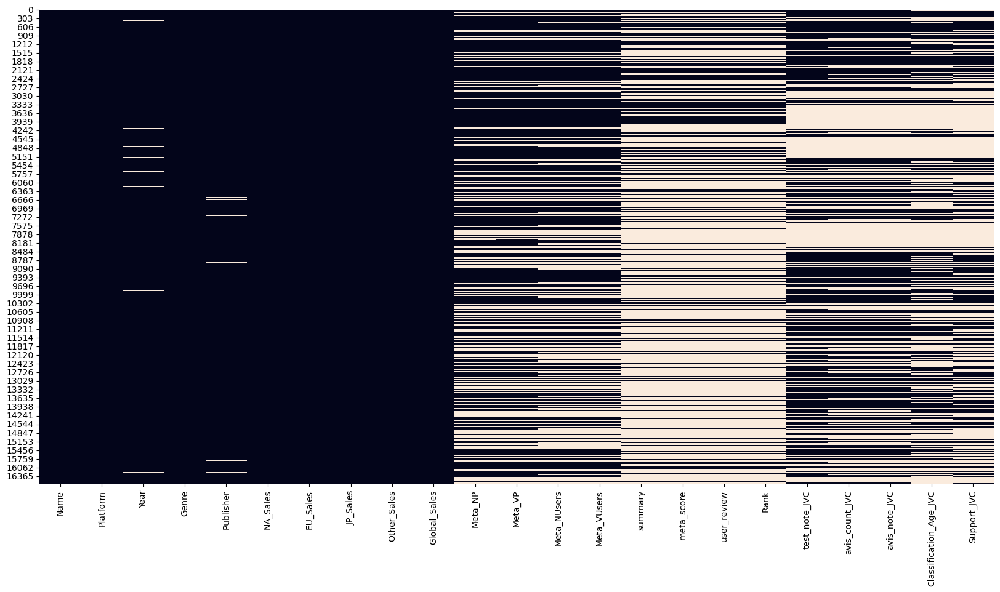

In [18]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

## Traitement des Nans

In [68]:
missing_values = df.isnull().mean() * 100

print('Taux de valeurs manquantes pour chaque colonne :\n', round(missing_values, 2))
print("shape :",df.shape)

Taux de valeurs manquantes pour chaque colonne :
 Name                       0.00
Platform                   0.00
Year                       1.64
Genre                      0.00
Publisher                  0.35
NA_Sales                   0.00
EU_Sales                   0.00
JP_Sales                   0.00
Other_Sales                0.00
Global_Sales               0.00
test_note_JVC             39.79
avis_count_JVC            45.22
avis_note_JVC             45.22
Classification_Age_JVC    57.42
Support_JVC               55.80
dtype: float64
shape : (16471, 15)


In [69]:
df= df.dropna(subset=['Year', 'Publisher', 'test_note_JVC', 'avis_count_JVC',
                      'avis_note_JVC', 'Classification_Age_JVC', 'Support_JVC'])

In [70]:
duplicates = df.duplicated()
print('Il y a', sum(duplicates), 'doublons dans le jeu de données.')

missing_values = df.isnull().mean() * 100

print('Taux de valeurs manquantes pour chaque colonne :\n', round(missing_values, 2))
print("shape :",df.shape)

Il y a 0 doublons dans le jeu de données.
Taux de valeurs manquantes pour chaque colonne :
 Name                      0.0
Platform                  0.0
Year                      0.0
Genre                     0.0
Publisher                 0.0
NA_Sales                  0.0
EU_Sales                  0.0
JP_Sales                  0.0
Other_Sales               0.0
Global_Sales              0.0
test_note_JVC             0.0
avis_count_JVC            0.0
avis_note_JVC             0.0
Classification_Age_JVC    0.0
Support_JVC               0.0
dtype: float64
shape : (5246, 15)


In [ ]:
#(df['test_note_JVC'].value_counts()[1:].astype(float)).plot()

In [28]:
#df['test_note_JVC']=df['test_note_JVC'].replace('--','11')

In [29]:
#df['test_note_JVC']= df['test_note_JVC'].astype('float')

In [77]:
#df['avis_count_JVC']= df['avis_count_JVC'].astype('float')


In [ ]:
#(df['avis_note_JVC'].value_counts(ascending=True)[1:].astype(float)).plot()

In [79]:
#df['avis_note_JVC']=df['avis_note_JVC'].replace('--','15')

In [80]:
#df['avis_note_JVC']= df['avis_note_JVC'].astype('float')

In [81]:
#df['Year']=pd.to_datetime(df['Year'], format='%Y')
df['Year']= df['Year'].astype('int')

In [82]:
#df['Year']=df['Year'].str.extract('(\d{4})', expand=False)
df.head()

,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,test_note_JVC,avis_count_JVC,avis_note_JVC,Classification_Age_JVC,Support_JVC
0,Wii Sports,Wii,2006,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74,14.0,687.0,13.8,7.0,DVD
1,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,19.0,3.0,19.0,3.0,eShop Console Virtuelle Cartouche
2,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82,16.0,3023.0,17.4,3.0,DVD
3,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00,15.0,581.0,16.5,3.0,DVD
6,New Super Mario Bros.,DS,2006,Platform,Nintendo,11.38,9.23,6.50,2.90,30.01,17.0,1370.0,17.4,3.0,Cartouche


In [85]:
#df.to_csv('data_clean.csv')

## Selection de la colonne target

In [86]:
target= df['Global_Sales']